In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import seaborn as sns
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')

df_questions = pd.read_csv("/content/questions_data.csv")
df_responses = pd.read_csv("/content/responses_data.csv", low_memory=False)

In [3]:
df_questions.head(3)

,question_id,question_number,subject,question_statement,correct_answer,exam_name,exam_year,exam_type,alternative_a,alternative_b,alternative_c,alternative_d,alternative_e
0,enem_2010-1_q_1,1,Ciências Humanas,"Antes, eram apenas as grandes cidades que se a...",b,enem_2010-1,2010,enem,a redução do processo de concentração de terras.,o aumento do aproveitamento de solos menos fér...,a ampliação do isolamento do espaço rural.,a estagnação da fronteira agrícola do país.,a diminuição do nível de emprego formal.
1,enem_2010-1_q_3,3,Ciências Humanas,A maioria das pessoas daqui era do campo. Vila...,a,enem_2010-1,2010,enem,dos impactos sociais da modernização da agricu...,da recomposição dos salários do trabalhador ru...,da exigência de qualificação do trabalhador ru...,da diminuição da importância da agricultura.,dos processos de desvalorização de áreas rurais.
2,enem_2010-1_q_4,4,Ciências Humanas,Os lixões são o pior tipo de disposição final ...,b,enem_2010-1,2010,enem,"causam problemas respiratórios, devido ao mau ...",são locais propícios a proliferação de vetores...,"provocam o fenômeno da chuva ácida, devido aos...","são instalados próximos ao centro das cidades,...",são responsáveis pelo desaparecimento das nasc...


In [4]:
df_questions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4515 entries, 0 to 4514
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   question_id         4515 non-null   object
 1   question_number     4515 non-null   int64 
 2   subject             4515 non-null   object
 3   question_statement  4515 non-null   object
 4   correct_answer      4515 non-null   object
 5   exam_name           4515 non-null   object
 6   exam_year           4515 non-null   int64 
 7   exam_type           4515 non-null   object
 8   alternative_a       4514 non-null   object
 9   alternative_b       4515 non-null   object
 10  alternative_c       4514 non-null   object
 11  alternative_d       4511 non-null   object
 12  alternative_e       3790 non-null   object
dtypes: int64(2), object(11)
memory usage: 458.7+ KB


In [5]:
df_responses.head(3)

,model,prompt_template,question_id,question_number,subject,chosen_answer,difficulty_level,uncertainty_level,bloom_taxonomy,is_correct,exam_name,provider,exam_year,exam_type
0,claude-3-5-haiku-20241022,chain_of_thought,q_1,1,Ciências Humanas,b,7.0,4.0,Analyze,True,enem_2010-1,Anthropic,2010,enem
1,claude-3-5-haiku-20241022,role_playing,q_1,1,Ciências Humanas,c,7.0,3.0,Analyze,False,enem_2010-1,Anthropic,2010,enem
2,claude-3-5-haiku-20241022,zero_shot,q_1,1,Ciências Humanas,b,7.0,4.0,Analyze,True,enem_2010-1,Anthropic,2010,enem


In [6]:
df_responses.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 270840 entries, 0 to 270839
Data columns (total 14 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   model              270840 non-null  object 
 1   prompt_template    270840 non-null  object 
 2   question_id        270840 non-null  object 
 3   question_number    270840 non-null  int64  
 4   subject            270840 non-null  object 
 5   chosen_answer      270565 non-null  object 
 6   difficulty_level   270567 non-null  float64
 7   uncertainty_level  270554 non-null  float64
 8   bloom_taxonomy     270566 non-null  object 
 9   is_correct         270840 non-null  bool   
 10  exam_name          270840 non-null  object 
 11  provider           270840 non-null  object 
 12  exam_year          270840 non-null  object 
 13  exam_type          270840 non-null  object 
dtypes: bool(1), float64(2), int64(1), object(10)
memory usage: 27.1+ MB


In [7]:
df_responses

,model,prompt_template,question_id,question_number,subject,chosen_answer,difficulty_level,uncertainty_level,bloom_taxonomy,is_correct,exam_name,provider,exam_year,exam_type
0,claude-3-5-haiku-20241022,chain_of_thought,q_1,1,Ciências Humanas,b,7.0,4.0,Analyze,True,enem_2010-1,Anthropic,2010,enem
1,claude-3-5-haiku-20241022,role_playing,q_1,1,Ciências Humanas,c,7.0,3.0,Analyze,False,enem_2010-1,Anthropic,2010,enem
2,claude-3-5-haiku-20241022,zero_shot,q_1,1,Ciências Humanas,b,7.0,4.0,Analyze,True,enem_2010-1,Anthropic,2010,enem
3,claude-3-5-sonnet-20241022,chain_of_thought,q_1,1,Ciências Humanas,b,7.0,3.0,Analyze,True,enem_2010-1,Anthropic,2010,enem
4,claude-3-5-sonnet-20241022,role_playing,q_1,1,Ciências Humanas,b,7.0,3.0,Analyze,True,enem_2010-1,Anthropic,2010,enem
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270835,o3-pro,role_playing,q_72,72,Biologia,d,7.0,3.0,Analyze,True,unicamp_2025,OpenAI,2025,unicamp
270836,o3-pro,zero_shot,q_72,72,Biologia,b,6.0,2.0,Analyze,False,unicamp_2025,OpenAI,2025,unicamp
270837,o4-mini,chain_of_thought,q_72,72,Biologia,b,7.0,1.0,Analyze,False,unicamp_2025,OpenAI,2025,unicamp
270838,o4-mini,role_playing,q_72,72,Biologia,d,6.0,1.0,Analyze,True,unicamp_2025,OpenAI,2025,unicamp


In [ ]:
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif'],
    'font.size': 10,
    'axes.linewidth': 0.8,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'xtick.major.size': 4,
    'ytick.major.size': 4,
    'legend.frameon': True,
    'legend.fancybox': False,
    'legend.edgecolor': 'black',
    'figure.dpi': 300
})

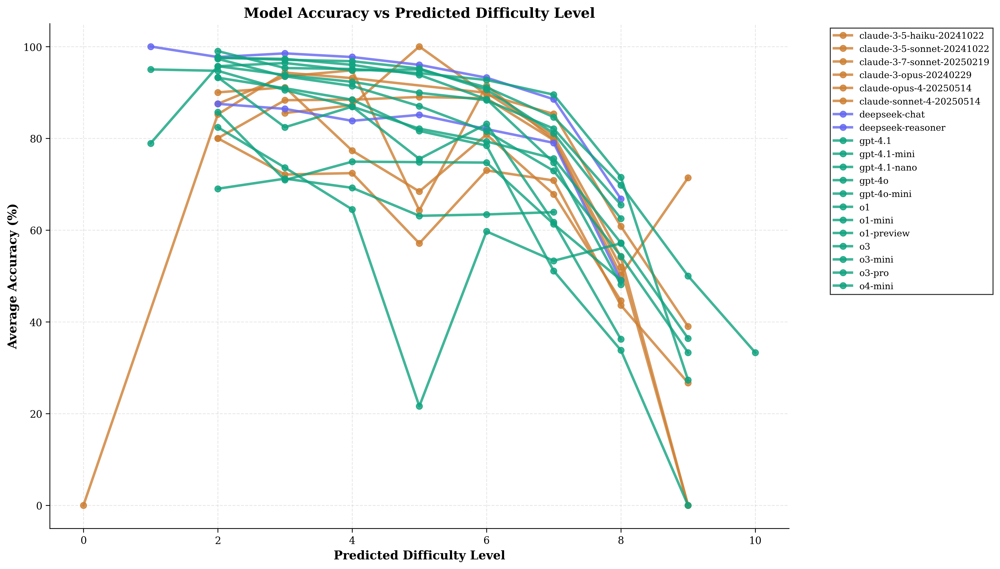

In [ ]:
plt.figure(figsize=(14, 8))

unique_models = df_responses['model'].unique()
model_colors = {}

for model in unique_models:
    model_lower = model.lower().replace(' ', '_').replace('-', '_')
    if any(x in model_lower for x in ['openai', 'gpt', 'o1', 'o3', 'o4']):
        base_color = '#10a37f'
    elif any(x in model_lower for x in ['claude', 'anthropic']):
        base_color = '#cd7f32'
    elif 'deepseek' in model_lower:
        base_color = '#6366f1'
    else:
        base_color = '#6b7280'
    model_colors[model] = base_color

difficulty_accuracy_data = []

for model in unique_models:
    model_data = df_responses[df_responses['model'] == model]

    difficulty_groups = model_data.groupby('difficulty_level').agg({
        'is_correct': ['mean', 'count']
    }).round(3)

    difficulty_groups.columns = ['avg_accuracy', 'count']
    difficulty_groups = difficulty_groups.reset_index()

    difficulty_groups = difficulty_groups[difficulty_groups['count'] >= 3]

    if len(difficulty_groups) > 1:
        plt.plot(difficulty_groups['difficulty_level'],
                difficulty_groups['avg_accuracy'] * 100,
                marker='o', linewidth=2.5, markersize=6, alpha=0.8,
                color=model_colors[model], label=model)

plt.xlabel('Predicted Difficulty Level', fontweight='bold', fontsize=12)
plt.ylabel('Average Accuracy (%)', fontweight='bold', fontsize=12)
plt.title('Model Accuracy vs Predicted Difficulty Level', fontweight='bold', fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)

plt.tight_layout()
plt.show()

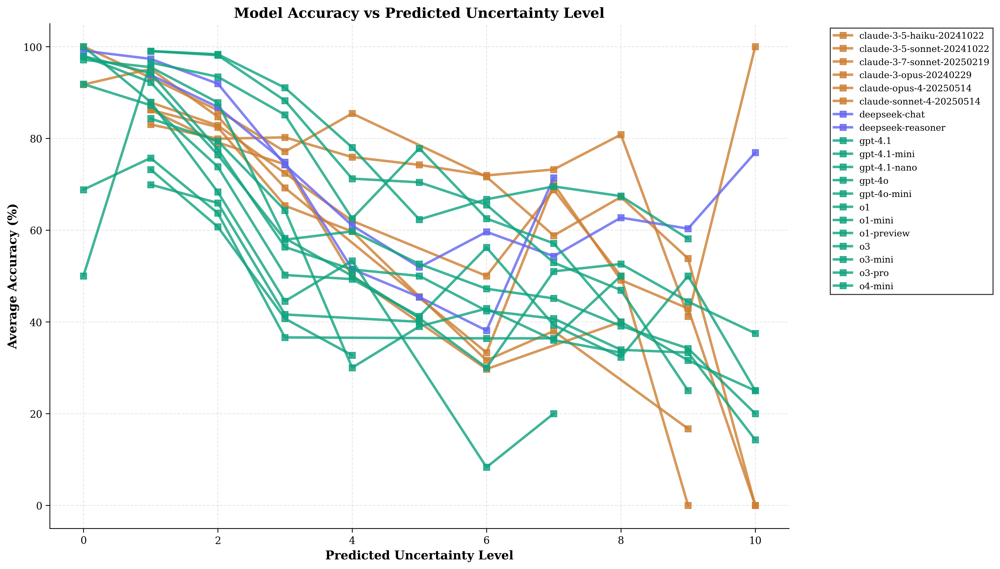

In [ ]:
plt.figure(figsize=(14, 8))

unique_models = df_responses['model'].unique()
model_colors = {}

for model in unique_models:
    model_lower = model.lower().replace(' ', '_').replace('-', '_')
    if any(x in model_lower for x in ['openai', 'gpt', 'o1', 'o3', 'o4']):
        base_color = '#10a37f'
    elif any(x in model_lower for x in ['claude', 'anthropic']):
        base_color = '#cd7f32'
    elif 'deepseek' in model_lower:
        base_color = '#6366f1'
    else:
        base_color = '#6b7280'
    model_colors[model] = base_color

uncertainty_accuracy_data = []

for model in unique_models:
    model_data = df_responses[df_responses['model'] == model]

    uncertainty_groups = model_data.groupby('uncertainty_level').agg({
        'is_correct': ['mean', 'count']
    }).round(3)

    uncertainty_groups.columns = ['avg_accuracy', 'count']
    uncertainty_groups = uncertainty_groups.reset_index()

    uncertainty_groups = uncertainty_groups[uncertainty_groups['count'] >= 3]

    if len(uncertainty_groups) > 1:
        plt.plot(uncertainty_groups['uncertainty_level'],
                uncertainty_groups['avg_accuracy'] * 100,
                marker='s', linewidth=2.5, markersize=6, alpha=0.8,
                color=model_colors[model], label=model)

plt.xlabel('Predicted Uncertainty Level', fontweight='bold', fontsize=12)
plt.ylabel('Average Accuracy (%)', fontweight='bold', fontsize=12)
plt.title('Model Accuracy vs Predicted Uncertainty Level', fontweight='bold', fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)

plt.tight_layout()
plt.show()

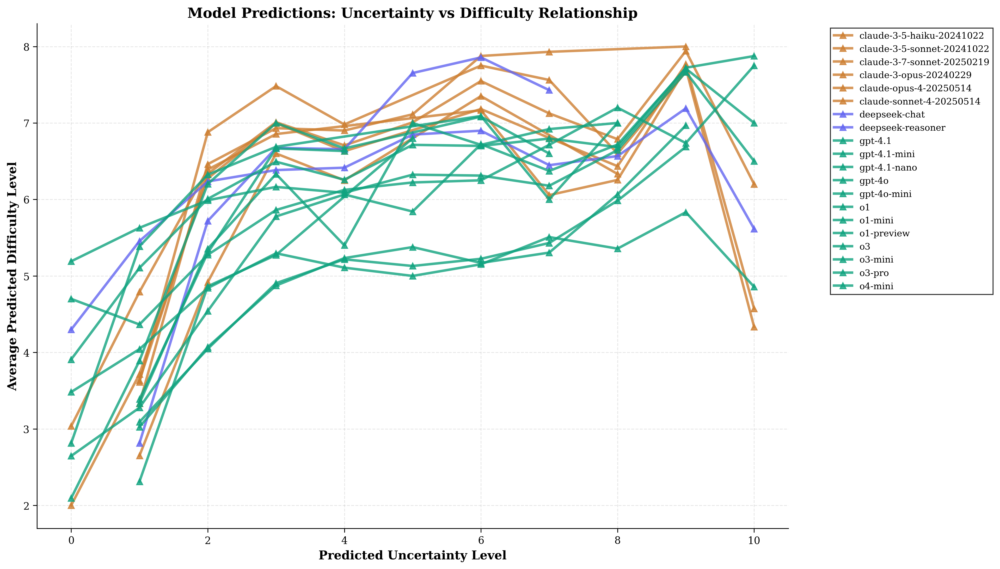

In [ ]:
plt.figure(figsize=(14, 8))

unique_models = df_responses['model'].unique()
model_colors = {}

for model in unique_models:
    model_lower = model.lower().replace(' ', '_').replace('-', '_')
    if any(x in model_lower for x in ['openai', 'gpt', 'o1', 'o3', 'o4']):
        base_color = '#10a37f'
    elif any(x in model_lower for x in ['claude', 'anthropic']):
        base_color = '#cd7f32'
    elif 'deepseek' in model_lower:
        base_color = '#6366f1'
    else:
        base_color = '#6b7280'
    model_colors[model] = base_color

uncertainty_difficulty_data = []

for model in unique_models:
    model_data = df_responses[df_responses['model'] == model]

    uncertainty_groups = model_data.groupby('uncertainty_level').agg({
        'difficulty_level': ['mean', 'count']
    }).round(3)

    uncertainty_groups.columns = ['avg_difficulty', 'count']
    uncertainty_groups = uncertainty_groups.reset_index()

    uncertainty_groups = uncertainty_groups[uncertainty_groups['count'] >= 3]

    if len(uncertainty_groups) > 1:
        plt.plot(uncertainty_groups['uncertainty_level'],
                uncertainty_groups['avg_difficulty'],
                marker='^', linewidth=2.5, markersize=6, alpha=0.8,
                color=model_colors[model], label=model)

plt.xlabel('Predicted Uncertainty Level', fontweight='bold', fontsize=12)
plt.ylabel('Average Predicted Difficulty Level', fontweight='bold', fontsize=12)
plt.title('Model Predictions: Uncertainty vs Difficulty Relationship', fontweight='bold', fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
provider_colors = {
    'OpenAI': '#10a37f',
    'Anthropic': '#cd7f32',
    'DeepSeek': '#6366f1',
}

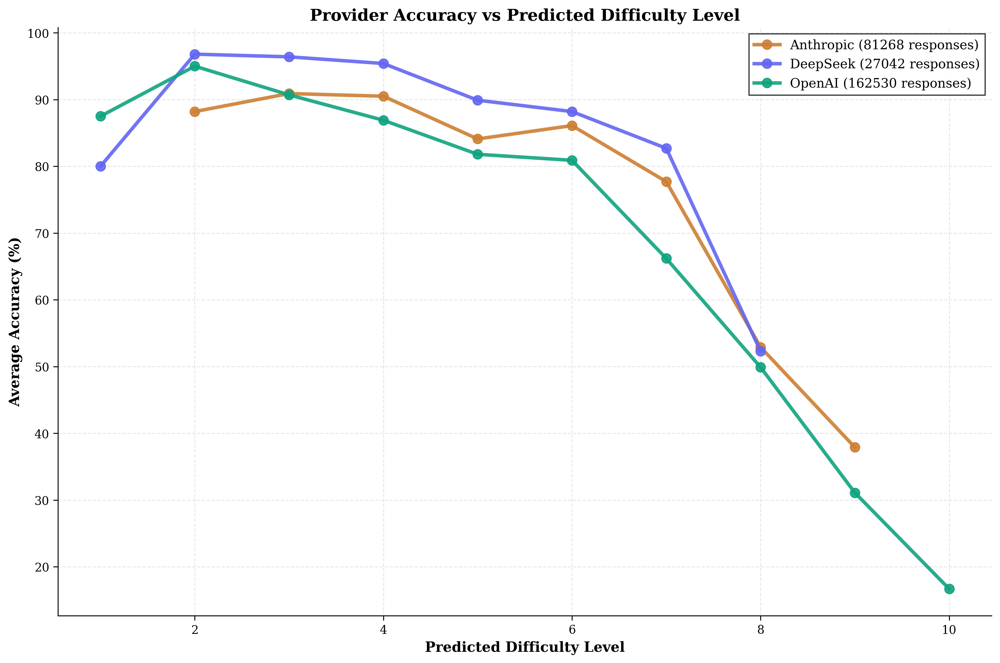

In [ ]:
plt.figure(figsize=(12, 8))

for provider in df_responses['provider'].unique():
    provider_data = df_responses[df_responses['provider'] == provider]

    difficulty_groups = provider_data.groupby('difficulty_level').agg({
        'is_correct': ['mean', 'count']
    }).round(3)

    difficulty_groups.columns = ['avg_accuracy', 'count']
    difficulty_groups = difficulty_groups.reset_index()

    difficulty_groups = difficulty_groups[difficulty_groups['count'] >= 5]

    if len(difficulty_groups) > 1:
        plt.plot(difficulty_groups['difficulty_level'],
                difficulty_groups['avg_accuracy'] * 100,
                marker='o', linewidth=3, markersize=8, alpha=0.9,
                color=provider_colors.get(provider, '#6b7280'),
                label=f'{provider} ({len(provider_data)} responses)')

plt.xlabel('Predicted Difficulty Level', fontweight='bold', fontsize=12)
plt.ylabel('Average Accuracy (%)', fontweight='bold', fontsize=12)
plt.title('Provider Accuracy vs Predicted Difficulty Level', fontweight='bold', fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()

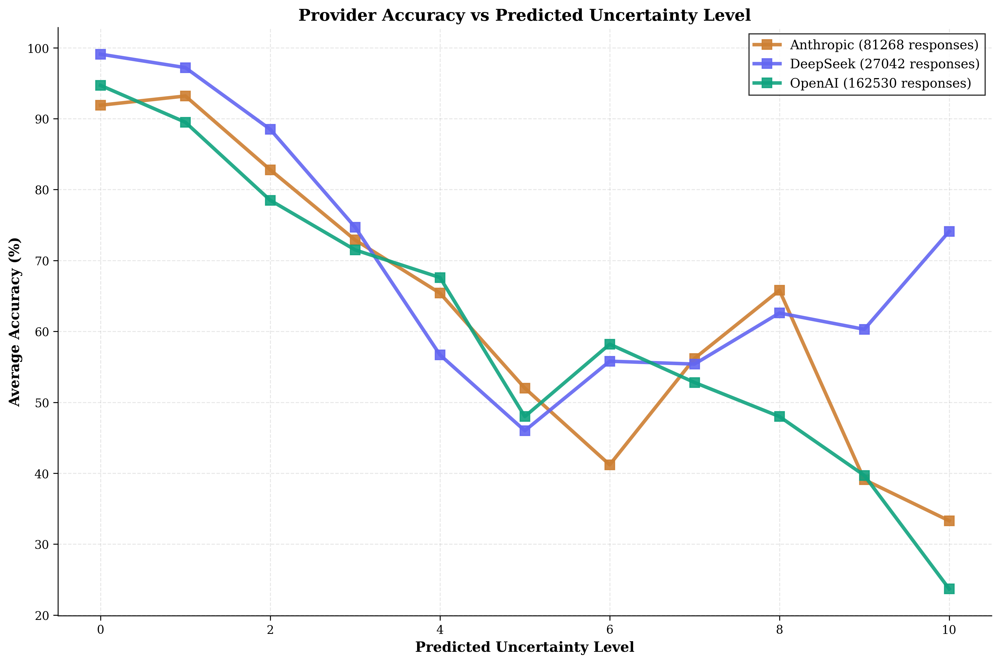

In [ ]:
plt.figure(figsize=(12, 8))

for provider in df_responses['provider'].unique():
    provider_data = df_responses[df_responses['provider'] == provider]

    uncertainty_groups = provider_data.groupby('uncertainty_level').agg({
        'is_correct': ['mean', 'count']
    }).round(3)

    uncertainty_groups.columns = ['avg_accuracy', 'count']
    uncertainty_groups = uncertainty_groups.reset_index()

    uncertainty_groups = uncertainty_groups[uncertainty_groups['count'] >= 5]

    if len(uncertainty_groups) > 1:
        plt.plot(uncertainty_groups['uncertainty_level'],
                uncertainty_groups['avg_accuracy'] * 100,
                marker='s', linewidth=3, markersize=8, alpha=0.9,
                color=provider_colors.get(provider, '#6b7280'),
                label=f'{provider} ({len(provider_data)} responses)')

plt.xlabel('Predicted Uncertainty Level', fontweight='bold', fontsize=12)
plt.ylabel('Average Accuracy (%)', fontweight='bold', fontsize=12)
plt.title('Provider Accuracy vs Predicted Uncertainty Level', fontweight='bold', fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()

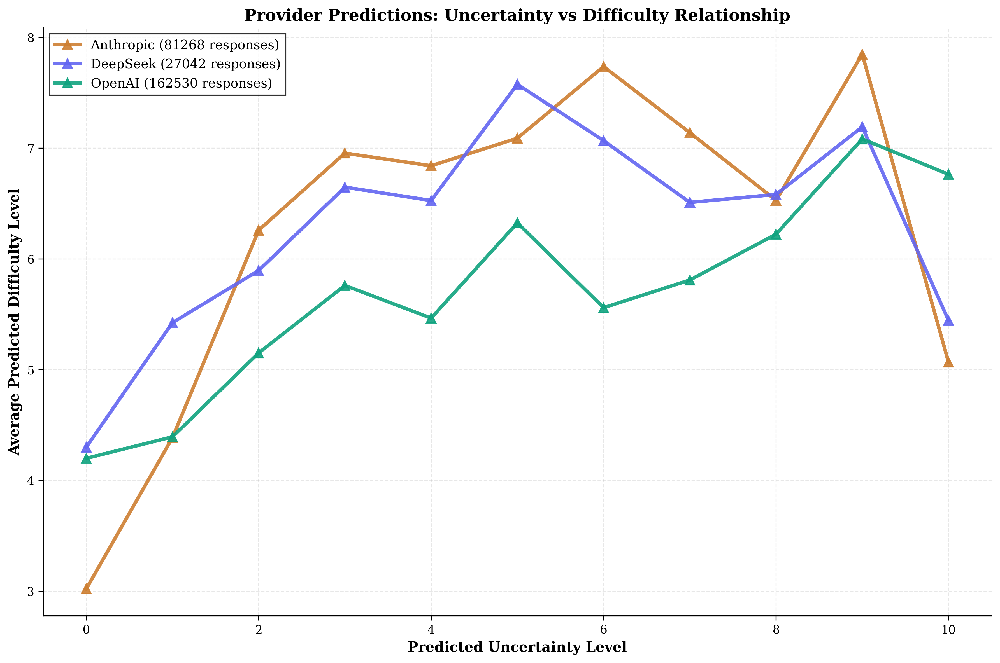

In [ ]:
plt.figure(figsize=(12, 8))

for provider in df_responses['provider'].unique():
    provider_data = df_responses[df_responses['provider'] == provider]

    uncertainty_groups = provider_data.groupby('uncertainty_level').agg({
        'difficulty_level': ['mean', 'count']
    }).round(3)

    uncertainty_groups.columns = ['avg_difficulty', 'count']
    uncertainty_groups = uncertainty_groups.reset_index()

    uncertainty_groups = uncertainty_groups[uncertainty_groups['count'] >= 5]

    if len(uncertainty_groups) > 1:
        plt.plot(uncertainty_groups['uncertainty_level'],
                uncertainty_groups['avg_difficulty'],
                marker='^', linewidth=3, markersize=8, alpha=0.9,
                color=provider_colors.get(provider, '#6b7280'),
                label=f'{provider} ({len(provider_data)} responses)')
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')
plt.xlabel('Predicted Uncertainty Level', fontweight='bold', fontsize=12)
plt.ylabel('Average Predicted Difficulty Level', fontweight='bold', fontsize=12)
plt.title('Provider Predictions: Uncertainty vs Difficulty Relationship', fontweight='bold', fontsize=14)
plt.grid(True, alpha=0.3, linestyle='--')
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()

In [ ]:
def clean_model_name(name):
    name_mapping = {
        'claude-3-5-haiku-20241022': 'Claude 3.5 Haiku',
        'claude-3-5-sonnet-20241022': 'Claude 3.5 Sonnet',
        'claude-3-7-sonnet-20250219': 'Claude 3.7 Sonnet',
        'claude-3-opus-20240229': 'Claude 3 Opus',
        'claude-opus-4-20250514': 'Claude Opus 4',
        'claude-sonnet-4-20250514': 'Claude Sonnet 4',
        'deepseek-chat': 'DeepSeek Chat',
        'deepseek-reasoner': 'DeepSeek Reasoner',
        'gpt-4.1': 'GPT-4.1',
        'gpt-4.1-mini': 'GPT-4.1 Mini',
        'gpt-4.1-nano': 'GPT-4.1 Nano',
        'gpt-4o': 'GPT-4o',
        'gpt-4o-mini': 'GPT-4o Mini',
        'o1': 'O1',
        'o1-mini': 'O1 Mini',
        'o1-preview': 'O1 Preview',
        'o3': 'O3',
        'o3-mini': 'O3 Mini',
        'o3-pro': 'O3 Pro',
        'o4-mini': 'O4 Mini'
    }
    return name_mapping.get(name, name)

def get_provider_color(model_name):
    if any(x in model_name for x in ['gpt', 'o1', 'o3', 'o4']):
        return '#10a37f'
    elif 'claude' in model_name:
        return '#cd7f32'
    elif 'deepseek' in model_name:
        return '#6366f1'
    else:
        return '#6b7280'

df_responses['difficulty_level'] = pd.to_numeric(df_responses['difficulty_level'], errors='coerce')
df_responses['uncertainty_level'] = pd.to_numeric(df_responses['uncertainty_level'], errors='coerce')

model_accuracy = df_responses.groupby('model')['is_correct'].mean().sort_values(ascending=False)
model_stats = df_responses.groupby('model').agg({
    'is_correct': ['mean', 'count'],
    'difficulty_level': 'mean',
    'uncertainty_level': 'mean'
}).round(4)

model_stats.columns = ['accuracy', 'total_questions', 'avg_difficulty', 'avg_uncertainty']
model_stats['clean_name'] = [clean_model_name(name) for name in model_stats.index]
model_stats['provider_color'] = [get_provider_color(name) for name in model_stats.index]

prompt_stats = df_responses.groupby('prompt_template').agg({
    'is_correct': ['mean', 'count'],
}).round(4)
prompt_stats.columns = ['accuracy', 'total_questions']

subject_stats = df_responses.groupby('subject')['is_correct'].agg(['mean', 'count']).round(4)
subject_stats.columns = ['accuracy', 'total_questions']

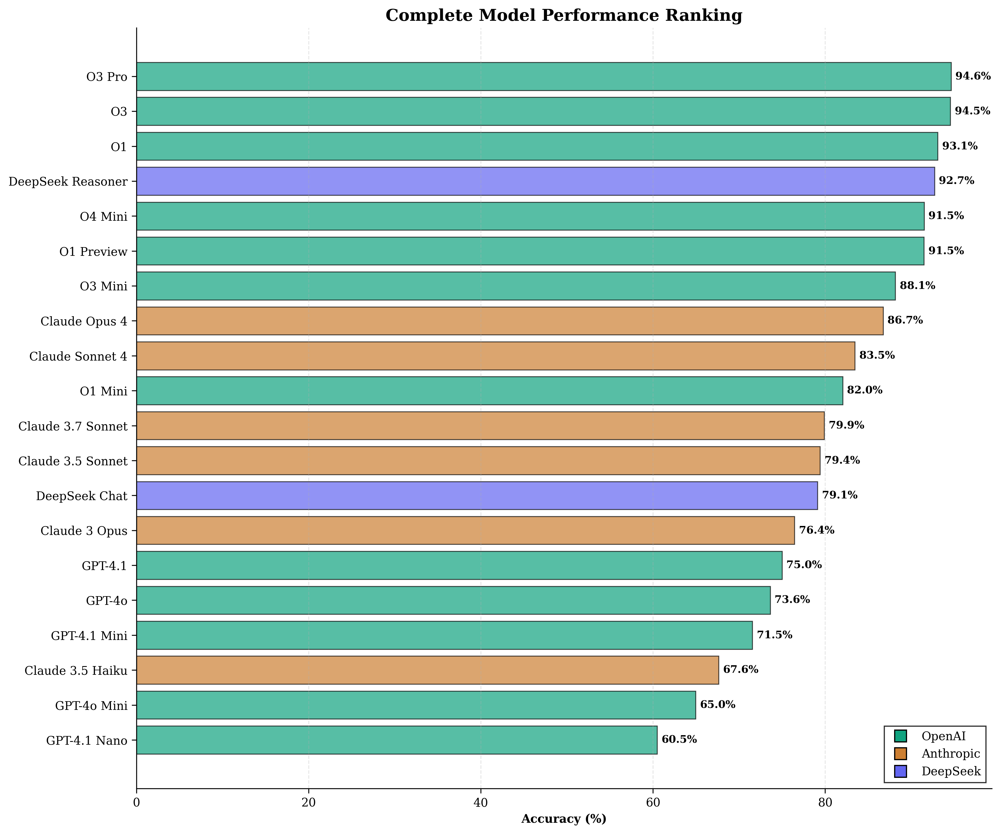

In [ ]:
plt.figure(figsize=(12, 10))

top_models = model_stats.sort_values('accuracy', ascending=True)

bars = plt.barh(range(len(top_models)), top_models['accuracy'] * 100,
                color=[top_models.loc[idx, 'provider_color'] for idx in top_models.index],
                alpha=0.7, edgecolor='black', linewidth=0.8)

plt.yticks(range(len(top_models)), top_models['clean_name'], fontsize=10)
plt.xlabel('Accuracy (%)', fontweight='bold')
plt.title('Complete Model Performance Ranking', fontweight='bold', fontsize=14)
plt.grid(axis='x', alpha=0.3, linestyle='--')

for i, (idx, row) in enumerate(top_models.iterrows()):
    plt.text(row['accuracy'] * 100 + 0.5, i, f'{row["accuracy"]*100:.1f}%',
             va='center', fontweight='bold', fontsize=9)

provider_legend_elements = [
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='#10a37f',
               markersize=10, label='OpenAI', markeredgecolor='black'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='#cd7f32',
               markersize=10, label='Anthropic', markeredgecolor='black'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='#6366f1',
               markersize=10, label='DeepSeek', markeredgecolor='black')
]
plt.legend(handles=provider_legend_elements, loc='lower right')

plt.tight_layout()
plt.show()

In [ ]:
def clean_model_name(name):
    name_mapping = {
        'claude-3-5-haiku-20241022': 'Claude 3.5 Haiku',
        'claude-3-5-sonnet-20241022': 'Claude 3.5 Sonnet',
        'claude-3-7-sonnet-20250219': 'Claude 3.7 Sonnet',
        'claude-3-opus-20240229': 'Claude 3 Opus',
        'claude-opus-4-20250514': 'Claude Opus 4',
        'claude-sonnet-4-20250514': 'Claude Sonnet 4',
        'deepseek-chat': 'DeepSeek Chat',
        'deepseek-reasoner': 'DeepSeek Reasoner',
        'gpt-4.1': 'GPT-4.1',
        'gpt-4.1-mini': 'GPT-4.1 Mini',
        'gpt-4.1-nano': 'GPT-4.1 Nano',
        'gpt-4o': 'GPT-4o',
        'gpt-4o-mini': 'GPT-4o Mini',
        'o1': 'O1',
        'o1-mini': 'O1 Mini',
        'o1-preview': 'O1 Preview',
        'o3': 'O3',
        'o3-mini': 'O3 Mini',
        'o3-pro': 'O3 Pro',
        'o4-mini': 'O4 Mini'
    }
    return name_mapping.get(name, name)

def get_provider_color(model_name):
    if any(x in model_name for x in ['gpt', 'o1', 'o3', 'o4']):
        return '#10a37f'
    elif 'claude' in model_name:
        return '#cd7f32'
    elif 'deepseek' in model_name:
        return '#6366f1'
    else:
        return '#6b7280'

def clean_subject_name(subject):
    subject_mapping = {
        'Português': 'Portuguese',
        'Linguagens, Códigos e suas Tecnologias': 'Portuguese',
        'Inglês': 'English',
        'Espanhol': 'Spanish',

        'Matemática': 'Mathematics',
        'Mídemática': 'Mathematics',

        'Física': 'Natural Sciences',
        'Química': 'Natural Sciences',
        'Biologia': 'Natural Sciences',
        'Ciências da Natureza e suas Tecnologias': 'Natural Sciences',
        'Ciências da Natureza': 'Natural Sciences',
        'Tecnologias': 'Natural Sciences',
        'Tecnologias da Informação': 'Natural Sciences',

        'História': 'Human Sciences',
        'Geografia': 'Geography',
        'Sociologia': 'Sociology',
        'Filosofia': 'Philosophy',
        'Ciências Humanas': 'Human Sciences',
        'CIÊNCIAS HUMANAS E SUAS TECNOLOGIAS': 'Human Sciences',
    }
    return subject_mapping.get(subject, subject)

df_responses['difficulty_level'] = pd.to_numeric(df_responses['difficulty_level'], errors='coerce')
df_responses['uncertainty_level'] = pd.to_numeric(df_responses['uncertainty_level'], errors='coerce')
df_responses['clean_subject'] = df_responses['subject'].apply(clean_subject_name)
df_responses['clean_model'] = df_responses['model'].apply(clean_model_name)

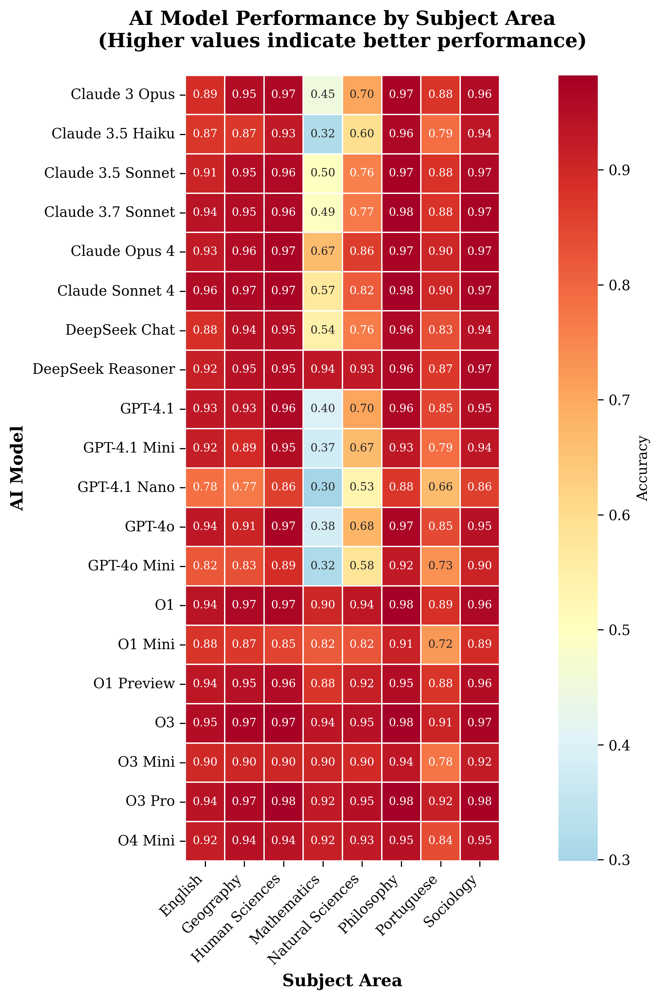

In [ ]:
model_subject_accuracy = df_responses.groupby(['clean_model', 'clean_subject'])['is_correct'].mean().unstack(fill_value=0)

fig, ax = plt.subplots(figsize=(12, 10))

sns.heatmap(model_subject_accuracy,
            annot=True,
            fmt='.2f',
            cmap='RdYlBu_r',
            center=0.5,
            square=True,
            linewidths=0.5,
            cbar_kws={'label': 'Accuracy'},
            annot_kws={'size': 8})

plt.title('AI Model Performance by Subject Area\n(Higher values indicate better performance)',
          fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Subject Area', fontsize=12, fontweight='bold')
plt.ylabel('AI Model', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

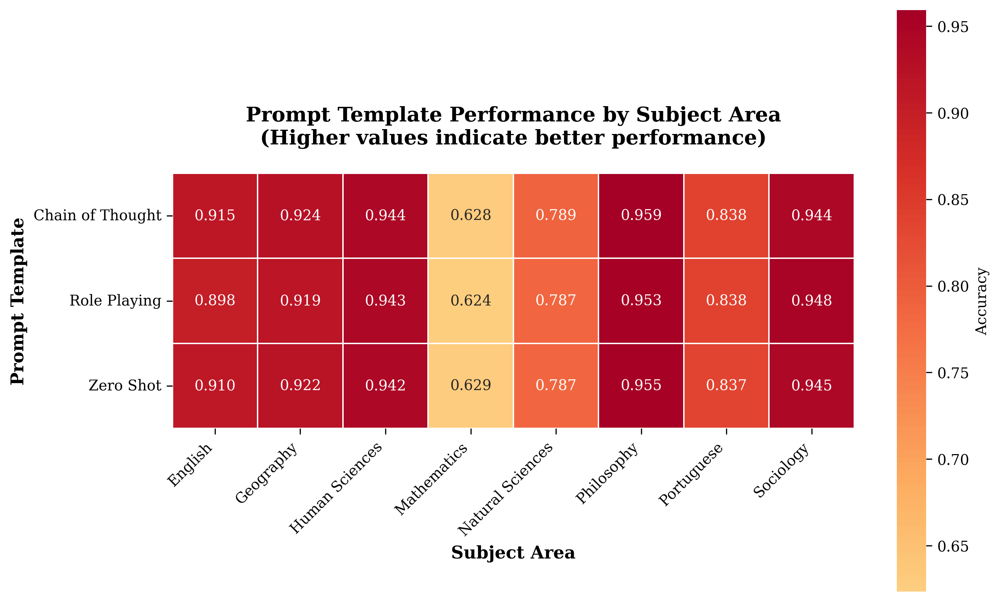

In [ ]:
prompt_subject_accuracy = df_responses.groupby(['prompt_template', 'clean_subject'])['is_correct'].mean().unstack(fill_value=0)

prompt_names = {
    'zero_shot': 'Zero Shot',
    'chain_of_thought': 'Chain of Thought',
    'role_playing': 'Role Playing'
}
prompt_subject_accuracy.index = [prompt_names.get(idx, idx) for idx in prompt_subject_accuracy.index]

fig, ax = plt.subplots(figsize=(10, 6))

sns.heatmap(prompt_subject_accuracy,
            annot=True,
            fmt='.3f',
            cmap='RdYlBu_r',
            center=0.5,
            square=True,
            linewidths=0.5,
            cbar_kws={'label': 'Accuracy'},
            annot_kws={'size': 10})

plt.title('Prompt Template Performance by Subject Area\n(Higher values indicate better performance)',
          fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Subject Area', fontsize=12, fontweight='bold')
plt.ylabel('Prompt Template', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

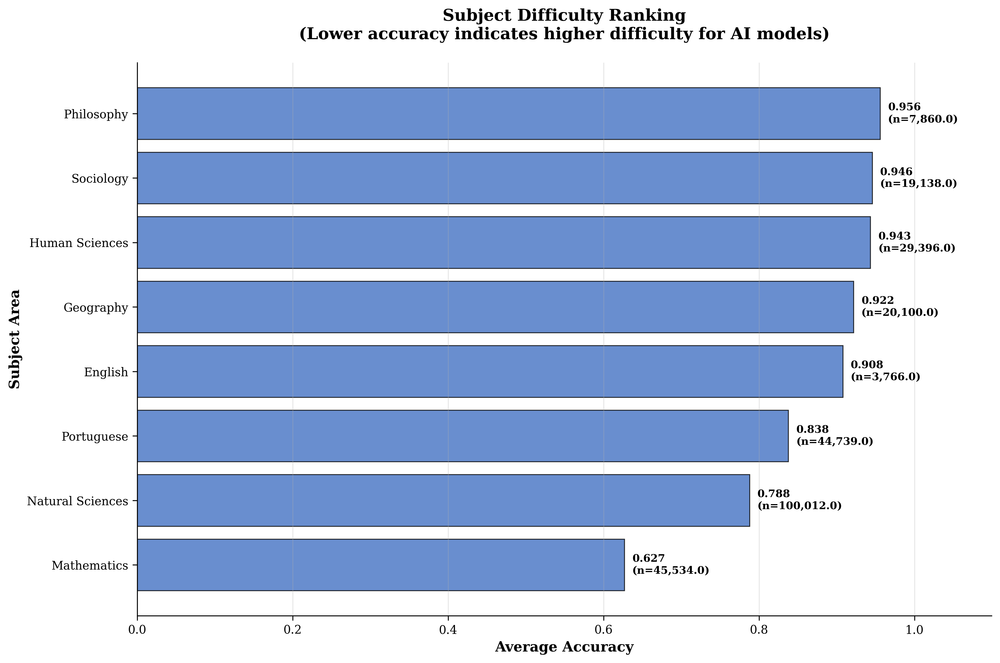

In [ ]:
subject_accuracy = df_responses.groupby('clean_subject')['is_correct'].agg(['mean', 'count']).sort_values('mean', ascending=True)

fig, ax = plt.subplots(figsize=(12, 8))

bars = plt.barh(range(len(subject_accuracy)), subject_accuracy['mean'],
                color='#4472C4', alpha=0.8, edgecolor='black', linewidth=0.8)

for i, (subject, row) in enumerate(subject_accuracy.iterrows()):
    plt.text(row['mean'] + 0.01, i, f'{row["mean"]:.3f}\n(n={row["count"]:,})',
             va='center', fontweight='bold', fontsize=9)

plt.yticks(range(len(subject_accuracy)), subject_accuracy.index)
plt.xlabel('Average Accuracy', fontsize=12, fontweight='bold')
plt.ylabel('Subject Area', fontsize=12, fontweight='bold')
plt.title('Subject Difficulty Ranking\n(Lower accuracy indicates higher difficulty for AI models)',
          fontsize=14, fontweight='bold', pad=20)
plt.xlim(0, max(subject_accuracy['mean']) * 1.15)
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

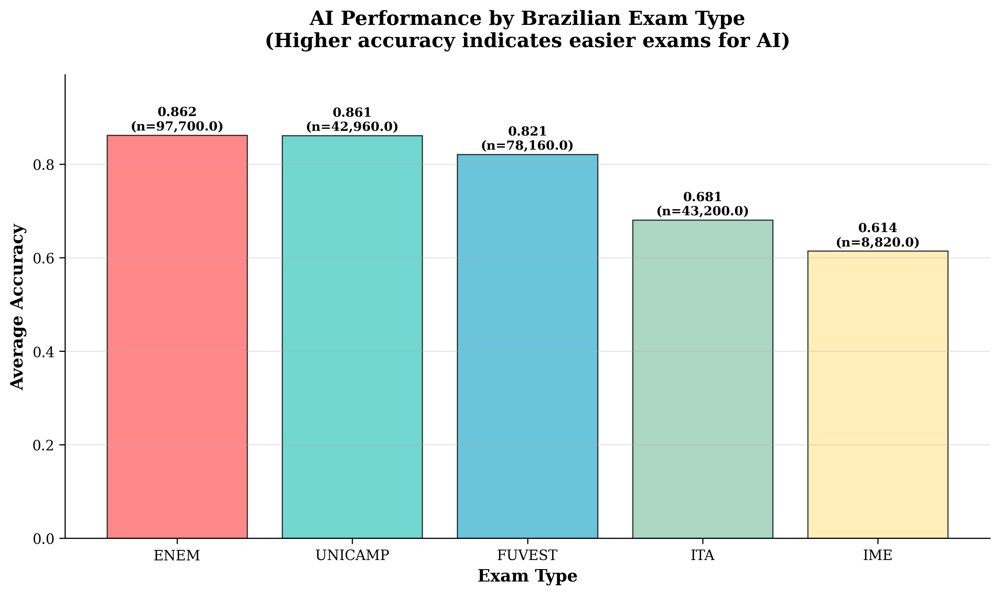

In [ ]:
def get_exam_type_group(exam_name):
    if 'enem' in exam_name.lower():
        return 'ENEM'
    elif 'fuvest' in exam_name.lower():
        return 'FUVEST'
    elif 'ita' in exam_name.lower():
        return 'ITA'
    elif 'ime' in exam_name.lower():
        return 'IME'
    elif 'unicamp' in exam_name.lower():
        return 'UNICAMP'
    else:
        return 'Other'

df_responses['exam_group'] = df_responses['exam_name'].apply(get_exam_type_group)
exam_performance = df_responses.groupby('exam_group')['is_correct'].agg(['mean', 'count']).sort_values('mean', ascending=False)

fig, ax = plt.subplots(figsize=(10, 6))

bars = plt.bar(exam_performance.index, exam_performance['mean'],
               color=['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7'],
               alpha=0.8, edgecolor='black', linewidth=0.8)

for bar, (exam, row) in zip(bars, exam_performance.iterrows()):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.005,
             f'{row["mean"]:.3f}\n(n={row["count"]:,})',
             ha='center', va='bottom', fontweight='bold', fontsize=9)

plt.title('AI Performance by Brazilian Exam Type\n(Higher accuracy indicates easier exams for AI)',
          fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Exam Type', fontsize=12, fontweight='bold')
plt.ylabel('Average Accuracy', fontsize=12, fontweight='bold')
plt.ylim(0, max(exam_performance['mean']) * 1.15)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

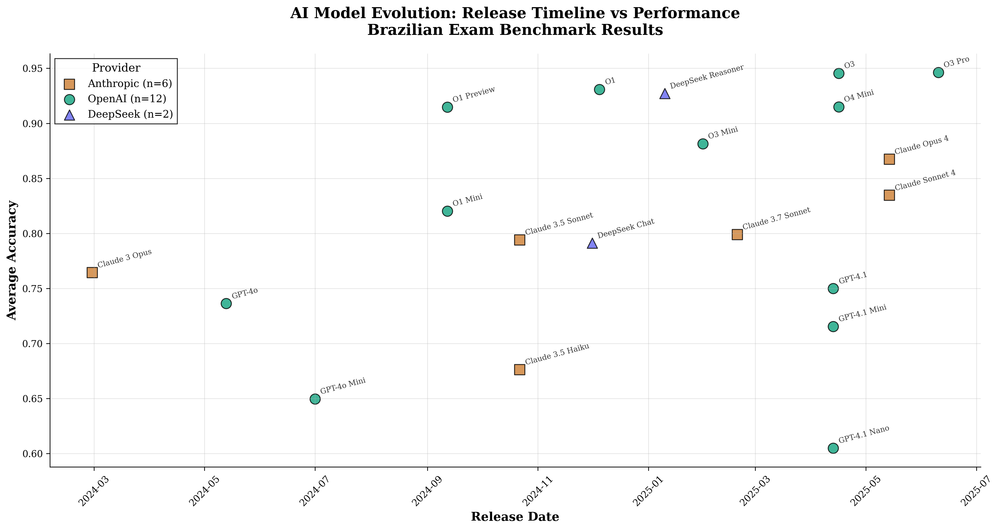

In [ ]:
import pandas as pd
from datetime import datetime
import matplotlib.dates as mdates

release_data = {
    'gpt-4.1': '2025-04-13',
    'o3': '2025-04-16',
    'o4-mini': '2025-04-16',
    'o3-mini': '2025-01-31',
    'gpt-4.1-mini': '2025-04-13',
    'gpt-4.1-nano': '2025-04-13',
    'gpt-4o': '2024-05-13',
    'gpt-4o-mini': '2024-07-01',  # Approximated to July 1st
    'o1': '2024-12-05',
    'o1-preview': '2024-09-12',
    'o1-mini': '2024-09-12',
    'o3-pro': '2025-06-10',
    'claude-opus-4-20250514': '2025-05-14',
    'claude-sonnet-4-20250514': '2025-05-14',
    'claude-3-7-sonnet-20250219': '2025-02-19',
    'claude-3-5-sonnet-20241022': '2024-10-22',
    'claude-3-5-haiku-20241022': '2024-10-22',
    'claude-3-opus-20240229': '2024-02-29',
    'deepseek-chat': '2024-12-01',  # Approximated to Dec 1st
    'deepseek-reasoner': '2025-01-10'
}

model_accuracy_stats = df_responses.groupby('model')['is_correct'].mean()

timeline_data = []
for model, accuracy in model_accuracy_stats.items():
    if model in release_data:
        timeline_data.append({
            'model': model,
            'clean_name': clean_model_name(model),
            'release_date': pd.to_datetime(release_data[model]),
            'accuracy': accuracy,
            'provider': 'OpenAI' if any(x in model for x in ['gpt', 'o1', 'o3', 'o4']) else
                       'Anthropic' if 'claude' in model else 'DeepSeek'
        })

timeline_df = pd.DataFrame(timeline_data).sort_values('release_date')

fig, ax = plt.subplots(figsize=(15, 8))

provider_colors = {'OpenAI': '#10a37f', 'Anthropic': '#cd7f32', 'DeepSeek': '#6366f1'}
provider_markers = {'OpenAI': 'o', 'Anthropic': 's', 'DeepSeek': '^'}

for provider in timeline_df['provider'].unique():
    provider_data = timeline_df[timeline_df['provider'] == provider]

    plt.scatter(provider_data['release_date'], provider_data['accuracy'],
               c=provider_colors[provider], s=120, alpha=0.8,
               marker=provider_markers[provider], edgecolors='black', linewidth=1,
               label=f'{provider} (n={len(provider_data)})')


for _, row in timeline_df.iterrows():
    plt.annotate(row['clean_name'],
                xy=(row['release_date'], row['accuracy']),
                xytext=(5, 5), textcoords='offset points',
                fontsize=8, alpha=0.8, rotation=15)

plt.title('AI Model Evolution: Release Timeline vs Performance\nBrazilian Exam Benchmark Results',
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Release Date', fontsize=13, fontweight='bold')
plt.ylabel('Average Accuracy', fontsize=13, fontweight='bold')

ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.xticks(rotation=45)

plt.grid(True, alpha=0.3)
plt.legend(title='Provider', title_fontsize=12, fontsize=11)
plt.tight_layout()
plt.show()

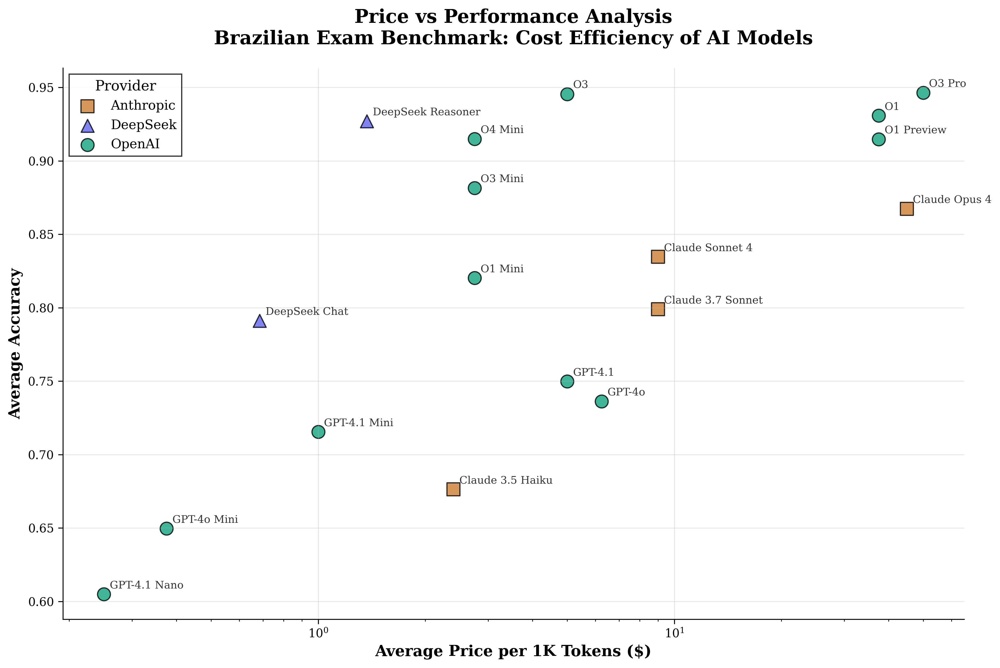

In [ ]:
pricing_data = {
    'gpt-4.1': (2.00 + 8.00) / 2,
    'o3': (2.00 + 8.00) / 2,
    'o4-mini': (1.10 + 4.40) / 2,
    'o3-mini': (1.10 + 4.40) / 2,
    'gpt-4.1-mini': (0.40 + 1.60) / 2,
    'gpt-4.1-nano': (0.10 + 0.40) / 2,
    'gpt-4o': (2.50 + 10.00) / 2,
    'gpt-4o-mini': (0.15 + 0.60) / 2,
    'o1': (15.00 + 60.00) / 2,
    'o1-preview': (15.00 + 60.00) / 2,
    'o1-mini': (1.10 + 4.40) / 2,
    'o3-pro': (20.00 + 80.00) / 2,
    'claude-opus-4-20250514': (15.00 + 75.00) / 2,
    'claude-sonnet-4-20250514': (3.00 + 15.00) / 2,
    'claude-3-7-sonnet-20250219': (3.00 + 15.00) / 2,
    'claude-3-5-haiku-20241022': (0.80 + 4.00) / 2,
    'deepseek-chat': (0.27 + 1.10) / 2,  # Using cache miss prices
    'deepseek-reasoner': (0.55 + 2.19) / 2
}

price_perf_data = []
for model, accuracy in model_accuracy_stats.items():
    if model in pricing_data:
        price_perf_data.append({
            'model': model,
            'clean_name': clean_model_name(model),
            'price_per_1k_tokens': pricing_data[model],
            'accuracy': accuracy,
            'provider': 'OpenAI' if any(x in model for x in ['gpt', 'o1', 'o3', 'o4']) else
                       'Anthropic' if 'claude' in model else 'DeepSeek'
        })

price_perf_df = pd.DataFrame(price_perf_data)

fig, ax = plt.subplots(figsize=(12, 8))

for provider in price_perf_df['provider'].unique():
    provider_data = price_perf_df[price_perf_df['provider'] == provider]

    plt.scatter(provider_data['price_per_1k_tokens'], provider_data['accuracy'],
               c=provider_colors[provider], s=120, alpha=0.8,
               marker=provider_markers[provider], edgecolors='black', linewidth=1,
               label=provider)

for _, row in price_perf_df.iterrows():
    plt.annotate(row['clean_name'],
                xy=(row['price_per_1k_tokens'], row['accuracy']),
                xytext=(5, 5), textcoords='offset points',
                fontsize=9, alpha=0.8)

plt.title('Price vs Performance Analysis\nBrazilian Exam Benchmark: Cost Efficiency of AI Models',
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Average Price per 1K Tokens ($)', fontsize=13, fontweight='bold')
plt.ylabel('Average Accuracy', fontsize=13, fontweight='bold')
plt.xscale('log')
plt.grid(True, alpha=0.3)
plt.legend(title='Provider', title_fontsize=12, fontsize=11)

plt.tight_layout()
plt.show()

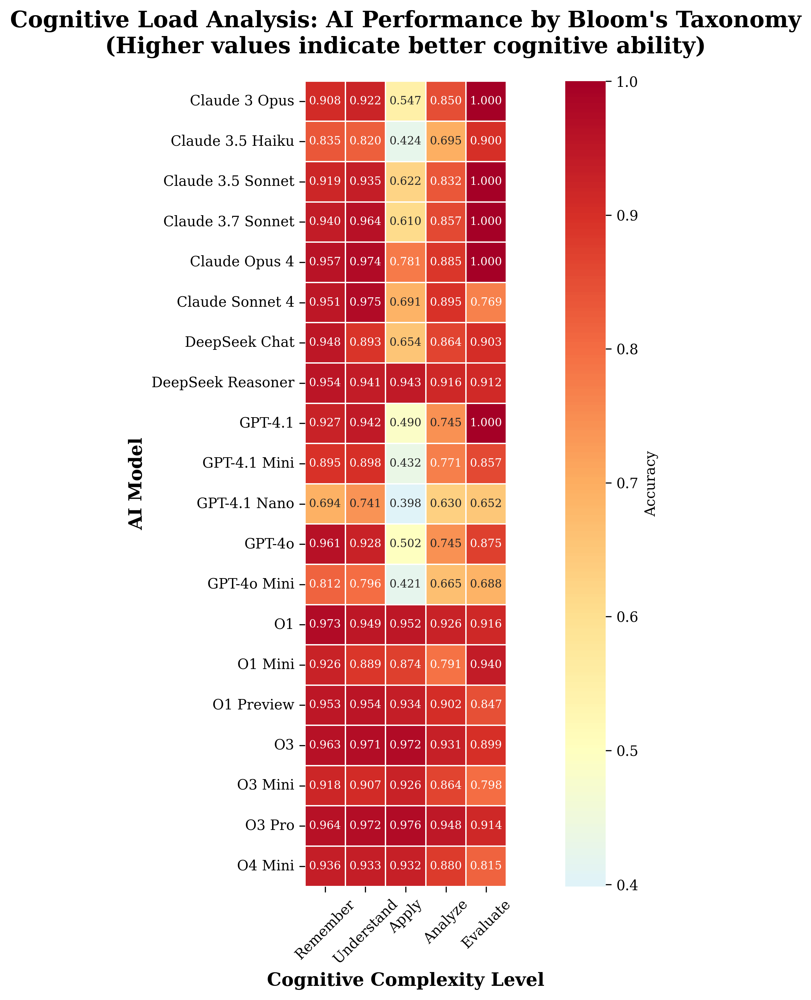

In [ ]:
def clean_bloom_taxonomy(bloom):
    if pd.isna(bloom):
        return 'Unknown'

    bloom = str(bloom).lower()

    if 'remember' in bloom:
        return 'Remember'
    elif 'understand' in bloom:
        return 'Understand'
    elif 'apply' in bloom:
        return 'Apply'
    elif 'analy' in bloom:
        return 'Analyze'
    elif 'evaluate' in bloom:
        return 'Evaluate'
    elif 'create' in bloom:
        return 'Create'
    else:
        return 'Other'

df_responses['clean_bloom'] = df_responses['bloom_taxonomy'].apply(clean_bloom_taxonomy)

cognitive_matrix = df_responses.groupby(['clean_model', 'clean_bloom'])['is_correct'].mean().unstack(fill_value=0)

bloom_order = ['Remember', 'Understand', 'Apply', 'Analyze', 'Evaluate']
cognitive_matrix = cognitive_matrix.reindex(columns=[col for col in bloom_order if col in cognitive_matrix.columns])

fig, ax = plt.subplots(figsize=(12, 10))

sns.heatmap(cognitive_matrix,
            annot=True, fmt='.3f',
            cmap='RdYlBu_r', center=0.5,
            square=True, linewidths=0.5,
            cbar_kws={'label': 'Accuracy'},
            annot_kws={'size': 8})

plt.title('Cognitive Load Analysis: AI Performance by Bloom\'s Taxonomy\n(Higher values indicate better cognitive ability)',
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Cognitive Complexity Level', fontsize=13, fontweight='bold')
plt.ylabel('AI Model', fontsize=13, fontweight='bold')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

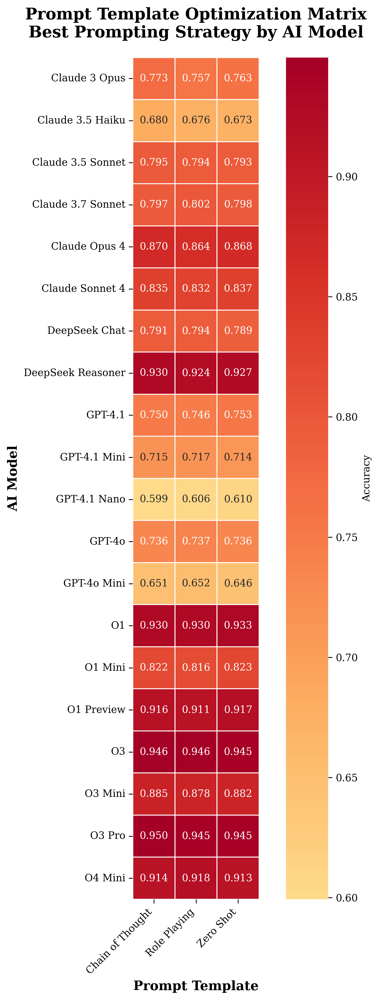

In [ ]:
prompt_model_performance = df_responses.groupby(['clean_model', 'prompt_template'])['is_correct'].agg(['mean', 'count']).reset_index()
prompt_model_performance = prompt_model_performance[prompt_model_performance['count'] >= 100]

prompt_matrix = prompt_model_performance.pivot(index='clean_model', columns='prompt_template', values='mean')
prompt_matrix = prompt_matrix.fillna(0)

prompt_names = {'zero_shot': 'Zero Shot', 'chain_of_thought': 'Chain of Thought', 'role_playing': 'Role Playing'}
prompt_matrix.columns = [prompt_names.get(col, col) for col in prompt_matrix.columns]

fig, ax = plt.subplots(figsize=(8, 14))

sns.heatmap(prompt_matrix,
            annot=True, fmt='.3f',
            cmap='RdYlBu_r', center=0.5,
            square=True, linewidths=0.5,
            cbar_kws={'label': 'Accuracy'},
            annot_kws={'size': 10})

plt.title('Prompt Template Optimization Matrix\nBest Prompting Strategy by AI Model',
          fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Prompt Template', fontsize=13, fontweight='bold')
plt.ylabel('AI Model', fontsize=13, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()